# Import and Setup

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from pathlib import Path
from collections import Counter
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt


# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory
import shutil
import random
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
import kagglehub
# kagglehub.dataset_download('<owner>/<dataset-slug>')

/kaggle/input/datasets/mohitsingh1804/plantvillage/PlantVillage/val/Tomato___Late_blight/c4f45383-715a-48b2-8ec7-c45d1c230a9d___GHLB_PS Leaf 13.1 Day 7.jpg
/kaggle/input/datasets/mohitsingh1804/plantvillage/PlantVillage/val/Tomato___Late_blight/7edf8e92-d212-46f4-843e-0c08bd263f73___GHLB2 Leaf 8944.JPG
/kaggle/input/datasets/mohitsingh1804/plantvillage/PlantVillage/val/Tomato___Late_blight/7d2ecdff-4eca-4f8e-b550-166d668498ba___GHLB2 Leaf 8602.JPG
/kaggle/input/datasets/mohitsingh1804/plantvillage/PlantVillage/val/Tomato___Late_blight/0524e8c4-56d9-41e2-b22d-33f22950ff93___RS_Late.B 5320.JPG
/kaggle/input/datasets/mohitsingh1804/plantvillage/PlantVillage/val/Tomato___Late_blight/8080a99f-e35d-4a1f-b26e-e2df8cf79408___RS_Late.B 6183.JPG
/kaggle/input/datasets/mohitsingh1804/plantvillage/PlantVillage/val/Tomato___Late_blight/dadc7e0f-8caf-4db0-9a05-f4b724c73bc2___GHLB2 Leaf 8685.JPG
/kaggle/input/datasets/mohitsingh1804/plantvillage/PlantVillage/val/Tomato___Late_blight/fbbe43eb-7d70-405

In [2]:

TRAIN_ROOT = "/kaggle/input/datasets/mohitsingh1804/plantvillage/PlantVillage/train"
VAL_ROOT   = "/kaggle/input/datasets/mohitsingh1804/plantvillage/PlantVillage/val"

train_classes = sorted(os.listdir(TRAIN_ROOT))
val_classes   = sorted(os.listdir(VAL_ROOT))

print(f"Train classes: {len(train_classes)}")
print(f"Val classes: {len(val_classes)}")
assert train_classes == val_classes, "Mismatch between train/val class folders!"

tomato_classes = [c for c in train_classes if c.lower().startswith("tomato")]
print(f"\nTomato classes found: {len(tomato_classes)}")
for c in tomato_classes:
    print(c)

Train classes: 38
Val classes: 38

Tomato classes found: 10
Tomato___Bacterial_spot
Tomato___Early_blight
Tomato___Late_blight
Tomato___Leaf_Mold
Tomato___Septoria_leaf_spot
Tomato___Spider_mites Two-spotted_spider_mite
Tomato___Target_Spot
Tomato___Tomato_Yellow_Leaf_Curl_Virus
Tomato___Tomato_mosaic_virus
Tomato___healthy


# Class Distribution Check

In [3]:
train_class_counts = {}
val_class_counts = {}

for c in tomato_classes:
    train_path = os.path.join(TRAIN_ROOT, c)
    val_path = os.path.join(VAL_ROOT, c)
    
    train_class_counts[c] = len(os.listdir(train_path))
    val_class_counts[c] = len(os.listdir(val_path))

print("Train class counts:")
for c, n in train_class_counts.items():
    print(f"  {c}: {n}")

print("\nVal class counts:")
for c, n in val_class_counts.items():
    print(f"  {c}: {n}")

print(f"\nTotal train images (tomato): {sum(train_class_counts.values())}")
print(f"Total val images (tomato): {sum(val_class_counts.values())}")

Train class counts:
  Tomato___Bacterial_spot: 1702
  Tomato___Early_blight: 800
  Tomato___Late_blight: 1527
  Tomato___Leaf_Mold: 761
  Tomato___Septoria_leaf_spot: 1417
  Tomato___Spider_mites Two-spotted_spider_mite: 1341
  Tomato___Target_Spot: 1123
  Tomato___Tomato_Yellow_Leaf_Curl_Virus: 4286
  Tomato___Tomato_mosaic_virus: 299
  Tomato___healthy: 1273

Val class counts:
  Tomato___Bacterial_spot: 425
  Tomato___Early_blight: 200
  Tomato___Late_blight: 382
  Tomato___Leaf_Mold: 191
  Tomato___Septoria_leaf_spot: 354
  Tomato___Spider_mites Two-spotted_spider_mite: 335
  Tomato___Target_Spot: 281
  Tomato___Tomato_Yellow_Leaf_Curl_Virus: 1071
  Tomato___Tomato_mosaic_virus: 74
  Tomato___healthy: 318

Total train images (tomato): 14529
Total val images (tomato): 3631


# Build File List (image_path, label

In [4]:
records = []

for split, root in [("train", TRAIN_ROOT), ("val", VAL_ROOT)]:
    for c in tomato_classes:
        class_dir = os.path.join(root, c)
        for fname in os.listdir(class_dir):
            if fname.lower().endswith((".jpg", ".jpeg", ".png")):
                records.append({
                    "filepath": os.path.join(class_dir, fname),
                    "label": c,
                    "split": split
                })

df = pd.DataFrame(records)
print(f"Total tomato images: {len(df)}")
print(f"Train: {(df['split'] == 'train').sum()}, Val: {(df['split'] == 'val').sum()}")
df.head()

Total tomato images: 18160
Train: 14529, Val: 3631


,filepath,label,split
0,/kaggle/input/datasets/mohitsingh1804/plantvil...,Tomato___Bacterial_spot,train
1,/kaggle/input/datasets/mohitsingh1804/plantvil...,Tomato___Bacterial_spot,train
2,/kaggle/input/datasets/mohitsingh1804/plantvil...,Tomato___Bacterial_spot,train
3,/kaggle/input/datasets/mohitsingh1804/plantvil...,Tomato___Bacterial_spot,train
4,/kaggle/input/datasets/mohitsingh1804/plantvil...,Tomato___Bacterial_spot,train


# Stratified Train/Val Split

In [5]:
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
from sklearn.model_selection import train_test_split

# 90% train, 10% val — stratified by class
train_df, val_df = train_test_split(
    df, test_size=0.10, stratify=df["label"], random_state=SEED
)

print(f"Train: {len(train_df)}  Val: {len(val_df)}")

# Sanity check: class distribution roughly preserved across splits
print("\nTrain class distribution:")
print(train_df["label"].value_counts(normalize=True).round(3))
print("\nVal class distribution:")
print(val_df["label"].value_counts(normalize=True).round(3))

# Save splits so all 5 backbones reuse the exact same split
train_df.to_csv("/kaggle/working/plantvillage_train.csv", index=False)
val_df.to_csv("/kaggle/working/plantvillage_val.csv", index=False)

print("\nSplits saved to /kaggle/working/")

Train: 16344  Val: 1816

Train class distribution:
label
Tomato___Tomato_Yellow_Leaf_Curl_Virus           0.295
Tomato___Bacterial_spot                          0.117
Tomato___Late_blight                             0.105
Tomato___Septoria_leaf_spot                      0.098
Tomato___Spider_mites Two-spotted_spider_mite    0.092
Tomato___healthy                                 0.088
Tomato___Target_Spot                             0.077
Tomato___Early_blight                            0.055
Tomato___Leaf_Mold                               0.052
Tomato___Tomato_mosaic_virus                     0.021
Name: proportion, dtype: float64

Val class distribution:
label
Tomato___Tomato_Yellow_Leaf_Curl_Virus           0.295
Tomato___Bacterial_spot                          0.117
Tomato___Late_blight                             0.105
Tomato___Septoria_leaf_spot                      0.097
Tomato___Spider_mites Two-spotted_spider_mite    0.093
Tomato___healthy                                 0.088

#  Label Encoding

In [6]:
label_names = sorted(df["label"].unique())
label_to_idx = {name: i for i, name in enumerate(label_names)}
idx_to_label = {i: name for name, i in label_to_idx.items()}
print(label_to_idx)

{'Tomato___Bacterial_spot': 0, 'Tomato___Early_blight': 1, 'Tomato___Late_blight': 2, 'Tomato___Leaf_Mold': 3, 'Tomato___Septoria_leaf_spot': 4, 'Tomato___Spider_mites Two-spotted_spider_mite': 5, 'Tomato___Target_Spot': 6, 'Tomato___Tomato_Yellow_Leaf_Curl_Virus': 7, 'Tomato___Tomato_mosaic_virus': 8, 'Tomato___healthy': 9}


# Saving it to disk

In [7]:
import json

with open("/kaggle/working/label_to_idx.json", "w") as f:
    json.dump(label_to_idx, f, indent=2)

print(f"\nTotal classes: {len(label_to_idx)}")


Total classes: 10


# Transforms

In [8]:
IMG_SIZE = 224  # standardize across CNN backbones; handle ViT separately if it needs a different size

IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]

train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=20),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.RandomAffine(degrees=0, translate=(0.1, 0.1), scale=(0.9, 1.1)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

# No augmentation for val/test — only resize + normalize
eval_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

#  Custom Dataset Class

In [9]:
class PlantVillageDataset(Dataset):
    def __init__(self, dataframe, label_to_idx, transform=None):
        self.df = dataframe.reset_index(drop=True)
        self.label_to_idx = label_to_idx
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        image = Image.open(row["filepath"]).convert("RGB")
        label = self.label_to_idx[row["label"]]

        if self.transform:
            image = self.transform(image)

        return image, label

 # Build DataLoaders

In [10]:
train_dataset = PlantVillageDataset(train_df, label_to_idx, transform=train_transform)
val_dataset   = PlantVillageDataset(val_df, label_to_idx, transform=eval_transform)

BATCH_SIZE = 32
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

print(f"Train batches: {len(train_loader)}  Val batches: {len(val_loader)}")

Train batches: 511  Val batches: 57


# Sanity Check: Visualize a Batch

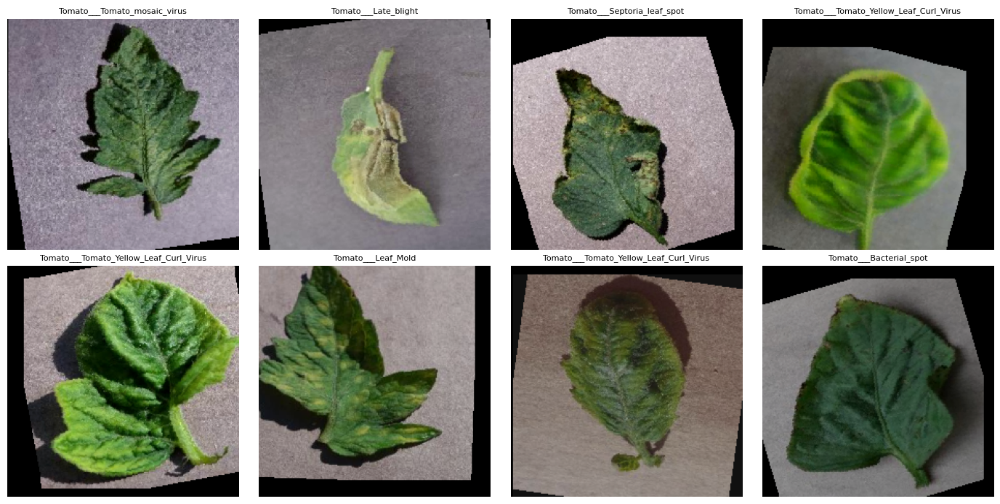

In [11]:
def denormalize(tensor, mean, std):
    mean = torch.tensor(mean).view(3, 1, 1)
    std = torch.tensor(std).view(3, 1, 1)
    return tensor * std + mean

images, labels = next(iter(train_loader))

fig, axes = plt.subplots(2, 4, figsize=(14, 7))
for i, ax in enumerate(axes.flat):
    img = denormalize(images[i], IMAGENET_MEAN, IMAGENET_STD).permute(1, 2, 0).numpy()
    img = np.clip(img, 0, 1)
    ax.imshow(img)
    ax.set_title(idx_to_label[labels[i].item()], fontsize=8)
    ax.axis("off")
plt.tight_layout()
plt.show()

# Model builder + device/config setup

In [12]:
def build_model(model_name, num_classes):
    if model_name == "efficientnet_b0":
        model = torchvision.models.efficientnet_b0(weights="IMAGENET1K_V1")  # load pretrained EfficientNetB0
        model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)  # replace final layer for our class count
    elif model_name == "resnet50":
        model = torchvision.models.resnet50(weights="IMAGENET1K_V2")  # load pretrained ResNet50
        model.fc = nn.Linear(model.fc.in_features, num_classes)  # replace final FC layer
    else:
        raise ValueError(f"Unknown model_name: {model_name}")  # guard against typos in model_name
    return model

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  # use GPU if available
num_classes = len(label_to_idx)  # number of tomato disease classes

# Config for both backbones 

In [13]:
import torch.nn as nn
import torch.optim as optim
import torchvision

model_names = ["efficientnet_b0", "resnet50"]  # both backbones to train
results = {}  # will store history + best_val_acc per model, keyed by model_name

# Train/validation loop functions

In [14]:
def train_one_epoch(model, loader, criterion, optimizer, device):
    model.train()  # enable dropout/batchnorm training behavior
    running_loss, correct, total = 0.0, 0, 0
    for images, labels in loader:
        images, labels = images.to(device), labels.to(device)  # move batch to device
        optimizer.zero_grad()  # clear old gradients
        outputs = model(images)  # forward pass
        loss = criterion(outputs, labels)  # compute loss
        loss.backward()  # backprop
        optimizer.step()  # update weights
        running_loss += loss.item() * images.size(0)  # accumulate loss (weighted by batch size)
        _, preds = torch.max(outputs, 1)  # get predicted class per sample
        correct += (preds == labels).sum().item()  # count correct predictions
        total += labels.size(0)  # count total samples seen
    return running_loss / total, correct / total  # average loss, accuracy for the epoch

def validate(model, loader, criterion, device):
    model.eval()  # disable dropout, freeze batchnorm stats
    running_loss, correct, total = 0.0, 0, 0
    with torch.no_grad():  # no gradient tracking needed for validation
        for images, labels in loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            running_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)
    return running_loss / total, correct / total

# Train both backbones in a loop, saving separate checkpoints

In [15]:
NUM_EPOCHS = 15  # epochs per backbone

for model_name in model_names:  # loop over both backbones
    print(f"\n===== Training {model_name} =====")

    model = build_model(model_name, num_classes).to(device)  # build this backbone
    criterion = nn.CrossEntropyLoss()  # fresh loss instance
    optimizer = optim.Adam(model.parameters(), lr=1e-4)  # fresh optimizer per model
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode="min", factor=0.5, patience=2)  # fresh scheduler per model

    best_val_acc = 0.0  # reset best acc tracker for this model
    history = {"train_loss": [], "train_acc": [], "val_loss": [], "val_acc": []}  # reset history for this model

    for epoch in range(NUM_EPOCHS):
        train_loss, train_acc = train_one_epoch(model, train_loader, criterion, optimizer, device)  # train 1 epoch
        val_loss, val_acc = validate(model, val_loader, criterion, device)  # validate
        scheduler.step(val_loss)  # adjust LR if val loss stalls

        # log metrics
        history["train_loss"].append(train_loss)
        history["train_acc"].append(train_acc)
        history["val_loss"].append(val_loss)
        history["val_acc"].append(val_acc)

        print(f"Epoch {epoch+1}/{NUM_EPOCHS} | Train Loss: {train_loss:.4f} Acc: {train_acc:.4f} | Val Loss: {val_loss:.4f} Acc: {val_acc:.4f}")

        if val_acc > best_val_acc:  # save checkpoint only on improvement
            best_val_acc = val_acc
            torch.save(model.state_dict(), f"/kaggle/working/best_{model_name}.pth")  # separate file per backbone

    results[model_name] = {"history": history, "best_val_acc": best_val_acc}  # store this model's results


===== Training efficientnet_b0 =====
Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth


100%|██████████| 20.5M/20.5M [00:00<00:00, 125MB/s] 


Epoch 1/15 | Train Loss: 0.4161 Acc: 0.8897 | Val Loss: 0.0569 Acc: 0.9796
Epoch 2/15 | Train Loss: 0.0818 Acc: 0.9752 | Val Loss: 0.0327 Acc: 0.9895
Epoch 3/15 | Train Loss: 0.0467 Acc: 0.9858 | Val Loss: 0.0164 Acc: 0.9972
Epoch 4/15 | Train Loss: 0.0343 Acc: 0.9894 | Val Loss: 0.0121 Acc: 0.9978
Epoch 5/15 | Train Loss: 0.0263 Acc: 0.9917 | Val Loss: 0.0129 Acc: 0.9961
Epoch 6/15 | Train Loss: 0.0237 Acc: 0.9927 | Val Loss: 0.0134 Acc: 0.9961
Epoch 7/15 | Train Loss: 0.0150 Acc: 0.9955 | Val Loss: 0.0132 Acc: 0.9967
Epoch 8/15 | Train Loss: 0.0129 Acc: 0.9964 | Val Loss: 0.0091 Acc: 0.9983
Epoch 9/15 | Train Loss: 0.0086 Acc: 0.9979 | Val Loss: 0.0105 Acc: 0.9983
Epoch 10/15 | Train Loss: 0.0123 Acc: 0.9965 | Val Loss: 0.0104 Acc: 0.9983
Epoch 11/15 | Train Loss: 0.0072 Acc: 0.9979 | Val Loss: 0.0103 Acc: 0.9983
Epoch 12/15 | Train Loss: 0.0062 Acc: 0.9984 | Val Loss: 0.0089 Acc: 0.9989
Epoch 13/15 | Train Loss: 0.0079 Acc: 0.9975 | Val Loss: 0.0081 Acc: 0.9994
Epoch 14/15 | Train L

100%|██████████| 97.8M/97.8M [00:00<00:00, 213MB/s]


Epoch 1/15 | Train Loss: 0.3243 Acc: 0.9011 | Val Loss: 0.0451 Acc: 0.9862
Epoch 2/15 | Train Loss: 0.0606 Acc: 0.9799 | Val Loss: 0.0308 Acc: 0.9901
Epoch 3/15 | Train Loss: 0.0416 Acc: 0.9871 | Val Loss: 0.0306 Acc: 0.9917
Epoch 4/15 | Train Loss: 0.0293 Acc: 0.9909 | Val Loss: 0.0305 Acc: 0.9906
Epoch 5/15 | Train Loss: 0.0263 Acc: 0.9915 | Val Loss: 0.0138 Acc: 0.9972
Epoch 6/15 | Train Loss: 0.0203 Acc: 0.9938 | Val Loss: 0.0130 Acc: 0.9956
Epoch 7/15 | Train Loss: 0.0182 Acc: 0.9944 | Val Loss: 0.0227 Acc: 0.9945
Epoch 8/15 | Train Loss: 0.0155 Acc: 0.9951 | Val Loss: 0.0185 Acc: 0.9956
Epoch 9/15 | Train Loss: 0.0192 Acc: 0.9947 | Val Loss: 0.0173 Acc: 0.9972
Epoch 10/15 | Train Loss: 0.0078 Acc: 0.9979 | Val Loss: 0.0093 Acc: 0.9983
Epoch 11/15 | Train Loss: 0.0048 Acc: 0.9985 | Val Loss: 0.0053 Acc: 0.9994
Epoch 12/15 | Train Loss: 0.0042 Acc: 0.9990 | Val Loss: 0.0103 Acc: 0.9978
Epoch 13/15 | Train Loss: 0.0070 Acc: 0.9977 | Val Loss: 0.0169 Acc: 0.9967
Epoch 14/15 | Train L

In [16]:
# ===== Block 6: Classification Evaluation — load best checkpoints, predict on val set =====
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

eval_results = {}  # store predictions/metrics per model

for model_name in model_names:
    model = build_model(model_name, num_classes).to(device)  # rebuild architecture
    model.load_state_dict(torch.load(f"/kaggle/working/best_{model_name}.pth"))  # load best weights
    model.eval()  # inference mode

    all_preds, all_labels = [], []
    with torch.no_grad():
        for images, labels in val_loader:
            images = images.to(device)
            outputs = model(images)
            preds = torch.argmax(outputs, dim=1).cpu().numpy()
            all_preds.extend(preds)
            all_labels.extend(labels.numpy())

    label_names_sorted = [idx_to_label[i] for i in range(num_classes)]  # ordered class names
    report = classification_report(all_labels, all_preds, target_names=label_names_sorted, output_dict=True)  # precision/recall/F1 per class
    cm = confusion_matrix(all_labels, all_preds)  # confusion matrix

    eval_results[model_name] = {"report": report, "cm": cm, "model": model}  # keep model object for XAI stage later

    print(f"\n===== {model_name} Classification Report =====")
    print(classification_report(all_labels, all_preds, target_names=label_names_sorted))


===== efficientnet_b0 Classification Report =====
                                               precision    recall  f1-score   support

                      Tomato___Bacterial_spot       1.00      1.00      1.00       213
                        Tomato___Early_blight       1.00      1.00      1.00       100
                         Tomato___Late_blight       1.00      0.99      1.00       191
                           Tomato___Leaf_Mold       1.00      1.00      1.00        95
                  Tomato___Septoria_leaf_spot       1.00      1.00      1.00       177
Tomato___Spider_mites Two-spotted_spider_mite       1.00      1.00      1.00       168
                         Tomato___Target_Spot       1.00      1.00      1.00       140
       Tomato___Tomato_Yellow_Leaf_Curl_Virus       1.00      1.00      1.00       536
                 Tomato___Tomato_mosaic_virus       1.00      1.00      1.00        37
                             Tomato___healthy       0.99      1.00      1.00  

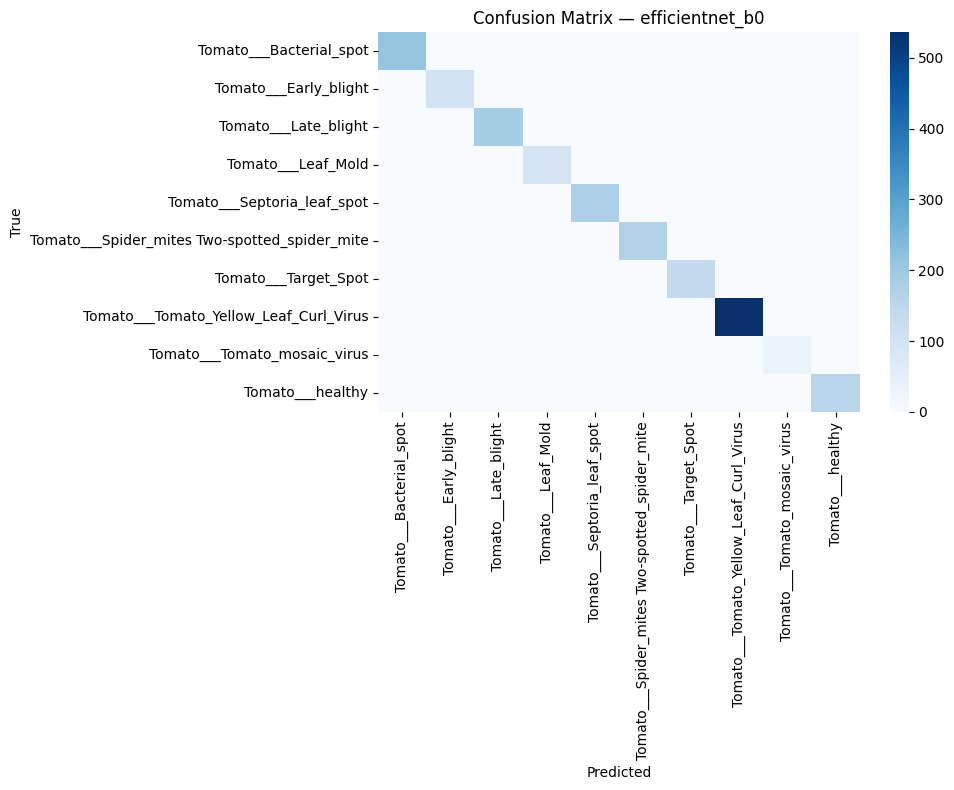

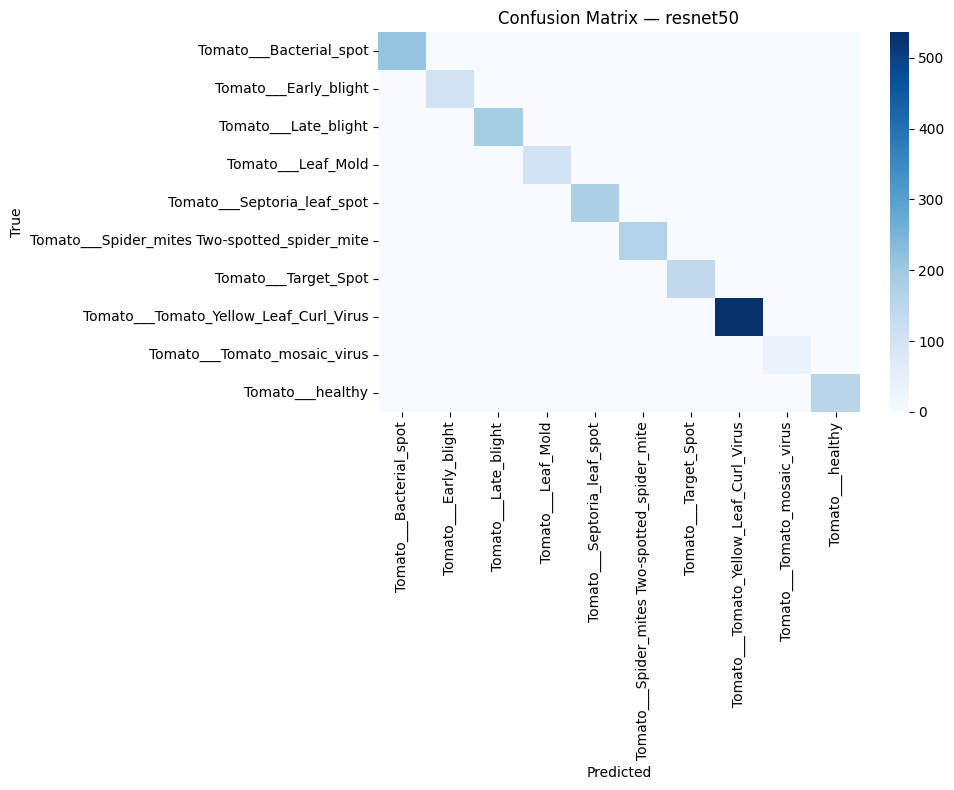

In [17]:
# ===== Block 7: Plot confusion matrices for both models =====
for model_name in model_names:
    cm = eval_results[model_name]["cm"]
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=False, cmap="Blues", xticklabels=label_names_sorted, yticklabels=label_names_sorted)  # heatmap, no text (too many classes)
    plt.title(f"Confusion Matrix — {model_name}")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

In [18]:
!pip install grad-cam shap lime --break-system-packages -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 57.2 MB/s eta 0:00:0000:0100:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [19]:
# ===== Block 8: Grad-CAM + Grad-CAM++ setup =====
from pytorch_grad_cam import GradCAM, GradCAMPlusPlus
from pytorch_grad_cam.utils.image import show_cam_on_image

def get_target_layer(model, model_name):  # last conv layer differs per architecture
    if model_name == "efficientnet_b0":
        return [model.features[-1]]
    elif model_name == "resnet50":
        return [model.layer4[-1]]

def generate_cam(model, model_name, image_tensor, cam_type="gradcam"):
    target_layers = get_target_layer(model, model_name)
    cam_class = GradCAM if cam_type == "gradcam" else GradCAMPlusPlus
    cam = cam_class(model=model, target_layers=target_layers)  # instantiate CAM method
    grayscale_cam = cam(input_tensor=image_tensor.unsqueeze(0).to(device))[0]  # run forward+backward, get saliency map
    return grayscale_cam  # 2D array, values 0-1

In [20]:
# ===== Block 9: SHAP setup =====
import shap

def get_shap_explainer(model, background_images):
    model.eval()
    explainer = shap.GradientExplainer(model, background_images.to(device))  # gradient-based SHAP for deep models
    return explainer

def generate_shap_map(explainer, image_tensor):
    shap_values = explainer.shap_values(image_tensor.unsqueeze(0).to(device))  # per-pixel attribution per class
    return shap_values

In [21]:
# ===== Block 10: LIME setup =====
from lime import lime_image
from skimage.segmentation import mark_boundaries

def predict_fn_factory(model):  # LIME needs a numpy-in, numpy-out prediction function
    def predict_fn(images_np):
        batch = torch.stack([eval_transform(Image.fromarray(img)) for img in images_np])  # apply same eval transform
        batch = batch.to(device)
        with torch.no_grad():
            outputs = model(batch)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
        return probs
    return predict_fn

def generate_lime_map(model, image_pil):
    explainer = lime_image.LimeImageExplainer()
    predict_fn = predict_fn_factory(model)
    explanation = explainer.explain_instance(
        np.array(image_pil), predict_fn, top_labels=1, hide_color=0, num_samples=1000
    )  # perturbation-based local explanation
    temp, mask = explanation.get_image_and_mask(
        explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=False
    )
    return mask  # binary mask of important superpixels

In [22]:
from scipy.ndimage import gaussian_filter

def normalize_map(m, clip_percentile=99):
    m = m.astype(np.float32)
    upper = np.percentile(np.abs(m), clip_percentile)  # clip extreme outliers instead of letting them dominate
    m = np.clip(m, -upper, upper)
    m = (m - m.min()) / (m.max() - m.min() + 1e-8)
    return m

def normalize_shap_map(m, sigma=4):
    m = np.abs(m)
    m = gaussian_filter(m, sigma=sigma)  # smooth sparse pixel-level attribution into visible regions
    m = (m - m.min()) / (m.max() - m.min() + 1e-8)
    return m

  0%|          | 0/1000 [00:00<?, ?it/s]

Agreement score at threshold 0.3: 0.0194


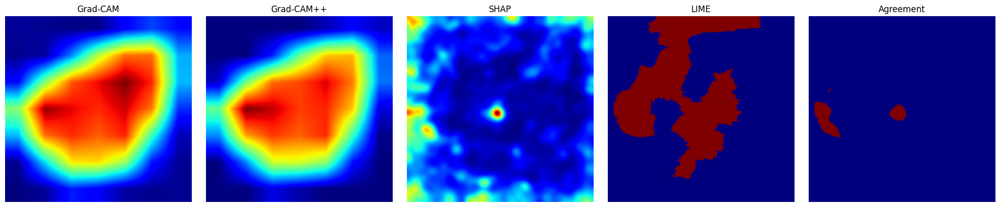

In [23]:
# ===== Block 11: Run all 4 XAI methods on a sample image, cross-validate via agreement scoring =====

def normalize_map(m):  # scale any saliency map to 0-1 for fair comparison
    m = m.astype(np.float32)
    m = (m - m.min()) / (m.max() - m.min() + 1e-8)
    return m

def agreement_score(maps, threshold=0.5):  # fraction of pixels where all methods agree "important"
    binarized = [(m > threshold).astype(np.uint8) for m in maps]  # threshold each map into binary important/not
    agreement_map = np.ones_like(binarized[0])
    for b in binarized:
        agreement_map = agreement_map & b  # pixel is "high-confidence" only if ALL methods flag it
    return agreement_map, agreement_map.sum() / agreement_map.size  # map + overall agreement ratio

model_name = "efficientnet_b0"  # pick which trained model to explain
model = eval_results[model_name]["model"]

sample_row = val_df.iloc[0]  # pick one validation image to explain
image_pil = Image.open(sample_row["filepath"]).convert("RGB").resize((IMG_SIZE, IMG_SIZE))
image_tensor = eval_transform(image_pil)

gradcam_map = normalize_map(generate_cam(model, model_name, image_tensor, "gradcam"))
gradcampp_map = normalize_map(generate_cam(model, model_name, image_tensor, "gradcam++"))

background_images = []
for images, _ in train_loader:
    background_images.append(images)
    if len(background_images) * BATCH_SIZE >= 50:
        break
background = torch.cat(background_images)[:50]
shap_explainer = get_shap_explainer(model, background)
# Get the model's predicted class for this image
predicted_class = torch.argmax(model(image_tensor.unsqueeze(0).to(device))).item()

shap_map_raw = generate_shap_map(shap_explainer, image_tensor)
predicted_class = torch.argmax(model(image_tensor.unsqueeze(0).to(device))).item()
shap_map = shap_map_raw[0][:, :, :, predicted_class]
shap_map = np.abs(shap_map).sum(axis=0)  # sum over channels -> (224, 224)
shap_map = normalize_shap_map(shap_map, sigma=4)  # smooth + normalize

lime_map = normalize_map(generate_lime_map(model, image_pil).astype(np.float32))

agreement_map, score = agreement_score([gradcam_map, gradcampp_map, shap_map, lime_map], threshold=0.3)
print(f"Agreement score at threshold 0.3: {score:.4f}")

# Visualize all maps side by side
fig, axes = plt.subplots(1, 5, figsize=(20, 4))
titles = ["Grad-CAM", "Grad-CAM++", "SHAP", "LIME", "Agreement"]
maps = [gradcam_map, gradcampp_map, shap_map, lime_map, agreement_map]
for ax, title, m in zip(axes, titles, maps):
    ax.imshow(m, cmap="jet")
    ax.set_title(title)
    ax.axis("off")
plt.tight_layout()
plt.show()

In [24]:
# ===== Block 12: Batch XAI pipeline — run all 4 methods + agreement scoring across many images =====
import pandas as pd
from tqdm import tqdm

N_SAMPLES = 50  # number of validation images to evaluate (start small, increase later)
model_name = "efficientnet_b0"  # which trained model to explain
model = eval_results[model_name]["model"]

sample_df = val_df.sample(n=N_SAMPLES, random_state=SEED).reset_index(drop=True)  # random subset of val set

# build one SHAP explainer up front (reused across all images — background stays the same)
background_images = []
for images, _ in train_loader:
    background_images.append(images)
    if len(background_images) * BATCH_SIZE >= 50:
        break
background = torch.cat(background_images)[:50]
shap_explainer = get_shap_explainer(model, background)

records = []  # store per-image results

for i in tqdm(range(len(sample_df))):
    row = sample_df.iloc[i]
    image_pil = Image.open(row["filepath"]).convert("RGB").resize((IMG_SIZE, IMG_SIZE))  # load + resize image
    image_tensor = eval_transform(image_pil)  # apply eval transform (resize+normalize)

    predicted_class = torch.argmax(model(image_tensor.unsqueeze(0).to(device))).item()  # model's predicted class

    try:
        # Grad-CAM
        gradcam_map = normalize_map(generate_cam(model, model_name, image_tensor, "gradcam"))

        # Grad-CAM++
        gradcampp_map = normalize_map(generate_cam(model, model_name, image_tensor, "gradcam++"))

        # SHAP
        shap_map_raw = generate_shap_map(shap_explainer, image_tensor)
        shap_map = shap_map_raw[0][:, :, :, predicted_class]
        shap_map = np.abs(shap_map).sum(axis=0)  # sum over channels
        shap_map = normalize_shap_map(shap_map, sigma=4)  # smooth + normalize

        # LIME
        lime_map = normalize_map(generate_lime_map(model, image_pil).astype(np.float32))

        # Agreement scoring at multiple thresholds
        for thresh in [0.3, 0.5, 0.7]:
            _, score = agreement_score([gradcam_map, gradcampp_map, shap_map, lime_map], threshold=thresh)
            records.append({
                "filepath": row["filepath"],
                "true_label": row["label"],
                "predicted_class_idx": predicted_class,
                "predicted_label": idx_to_label[predicted_class],
                "threshold": thresh,
                "agreement_score": score
            })

    except Exception as e:
        print(f"Skipped image {i} ({row['filepath']}) due to error: {e}")  # skip broken images, keep loop running
        continue

results_df = pd.DataFrame(records)  # combine all results into one dataframe
results_df.to_csv("/kaggle/working/xai_agreement_scores.csv", index=False)  # save for later analysis/plots

print(f"\nCompleted {len(sample_df)} images")
print(results_df.groupby("threshold")["agreement_score"].agg(["mean", "std", "min", "max"]))  # summary stats per threshold

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  2%|▏         | 1/50 [00:16<13:31, 16.56s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  4%|▍         | 2/50 [00:33<13:27, 16.83s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  6%|▌         | 3/50 [00:50<13:10, 16.82s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  8%|▊         | 4/50 [01:06<12:43, 16.61s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 10%|█         | 5/50 [01:23<12:24, 16.54s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 12%|█▏        | 6/50 [01:39<12:11, 16.62s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 14%|█▍        | 7/50 [01:56<11:52, 16.57s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 16%|█▌        | 8/50 [02:12<11:33, 16.50s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 18%|█▊        | 9/50 [02:29<11:15, 16.48s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 20%|██        | 10/50 [02:45<11:01, 16.54s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 22%|██▏       | 11/50 [03:02<10:44, 16.53s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 24%|██▍       | 12/50 [03:18<10:28, 16.54s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 26%|██▌       | 13/50 [03:35<10:11, 16.53s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 28%|██▊       | 14/50 [03:51<09:55, 16.55s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 30%|███       | 15/50 [04:08<09:36, 16.48s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 32%|███▏      | 16/50 [04:24<09:17, 16.41s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 34%|███▍      | 17/50 [04:41<09:06, 16.56s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 36%|███▌      | 18/50 [04:57<08:47, 16.50s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 38%|███▊      | 19/50 [05:14<08:29, 16.42s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 40%|████      | 20/50 [05:30<08:14, 16.47s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 42%|████▏     | 21/50 [05:47<07:58, 16.49s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 44%|████▍     | 22/50 [06:03<07:41, 16.49s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 46%|████▌     | 23/50 [06:20<07:27, 16.56s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 48%|████▊     | 24/50 [06:37<07:12, 16.62s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 50%|█████     | 25/50 [06:53<06:57, 16.69s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 52%|█████▏    | 26/50 [07:10<06:40, 16.70s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 54%|█████▍    | 27/50 [07:26<06:20, 16.56s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 56%|█████▌    | 28/50 [07:43<06:04, 16.56s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 58%|█████▊    | 29/50 [08:00<05:48, 16.59s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 60%|██████    | 30/50 [08:16<05:32, 16.60s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 62%|██████▏   | 31/50 [08:33<05:15, 16.61s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 64%|██████▍   | 32/50 [08:49<04:58, 16.57s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 66%|██████▌   | 33/50 [09:06<04:40, 16.51s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 68%|██████▊   | 34/50 [09:22<04:25, 16.56s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 70%|███████   | 35/50 [09:39<04:08, 16.55s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 72%|███████▏  | 36/50 [09:56<03:51, 16.57s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 74%|███████▍  | 37/50 [10:12<03:35, 16.61s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 76%|███████▌  | 38/50 [10:29<03:20, 16.70s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 78%|███████▊  | 39/50 [10:46<03:04, 16.74s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 80%|████████  | 40/50 [11:03<02:47, 16.72s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 82%|████████▏ | 41/50 [11:19<02:30, 16.68s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 84%|████████▍ | 42/50 [11:36<02:13, 16.74s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 86%|████████▌ | 43/50 [11:52<01:56, 16.62s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 88%|████████▊ | 44/50 [12:09<01:40, 16.69s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 90%|█████████ | 45/50 [12:26<01:23, 16.64s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 92%|█████████▏| 46/50 [12:43<01:06, 16.73s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 94%|█████████▍| 47/50 [12:59<00:49, 16.64s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 96%|█████████▌| 48/50 [13:16<00:33, 16.66s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 98%|█████████▊| 49/50 [13:33<00:16, 16.67s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

100%|██████████| 50/50 [13:49<00:00, 16.59s/it]


Completed 50 images
               mean       std  min       max
threshold                                   
0.3        0.016623  0.024207  0.0  0.121273
0.5        0.002353  0.006783  0.0  0.041713
0.7        0.000259  0.001245  0.0  0.008630


In [25]:
# ===== Block 13: Batch XAI pipeline — same run, but for ResNet50 =====

model_name = "resnet50"  # switch to second backbone
model = eval_results[model_name]["model"]

# rebuild SHAP explainer for this model (explainer is model-specific)
background_images = []
for images, _ in train_loader:
    background_images.append(images)
    if len(background_images) * BATCH_SIZE >= 50:
        break
background = torch.cat(background_images)[:50]
shap_explainer = get_shap_explainer(model, background)

records_resnet = []  # separate results list for resnet50

for i in tqdm(range(len(sample_df))):  # reuse same 50 sampled images for fair comparison
    row = sample_df.iloc[i]
    image_pil = Image.open(row["filepath"]).convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    image_tensor = eval_transform(image_pil)

    predicted_class = torch.argmax(model(image_tensor.unsqueeze(0).to(device))).item()

    try:
        gradcam_map = normalize_map(generate_cam(model, model_name, image_tensor, "gradcam"))
        gradcampp_map = normalize_map(generate_cam(model, model_name, image_tensor, "gradcam++"))

        shap_map_raw = generate_shap_map(shap_explainer, image_tensor)
        shap_map = shap_map_raw[0][:, :, :, predicted_class]
        shap_map = np.abs(shap_map).sum(axis=0)
        shap_map = normalize_shap_map(shap_map, sigma=4)

        lime_map = normalize_map(generate_lime_map(model, image_pil).astype(np.float32))

        for thresh in [0.3, 0.5, 0.7]:
            _, score = agreement_score([gradcam_map, gradcampp_map, shap_map, lime_map], threshold=thresh)
            records_resnet.append({
                "filepath": row["filepath"],
                "true_label": row["label"],
                "predicted_class_idx": predicted_class,
                "predicted_label": idx_to_label[predicted_class],
                "threshold": thresh,
                "agreement_score": score
            })

    except Exception as e:
        print(f"Skipped image {i} ({row['filepath']}) due to error: {e}")
        continue

results_df_resnet = pd.DataFrame(records_resnet)
results_df_resnet.to_csv("/kaggle/working/xai_agreement_scores_resnet50.csv", index=False)  # separate file per model

print(f"\nCompleted {len(sample_df)} images on ResNet50")
print(results_df_resnet.groupby("threshold")["agreement_score"].agg(["mean", "std", "min", "max"]))

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  2%|▏         | 1/50 [00:26<21:38, 26.51s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  4%|▍         | 2/50 [00:52<20:55, 26.16s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  6%|▌         | 3/50 [01:18<20:24, 26.06s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  8%|▊         | 4/50 [01:44<19:54, 25.96s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 10%|█         | 5/50 [02:10<19:30, 26.01s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 12%|█▏        | 6/50 [02:36<19:04, 26.02s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 14%|█▍        | 7/50 [03:02<18:37, 26.00s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 16%|█▌        | 8/50 [03:28<18:14, 26.05s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 18%|█▊        | 9/50 [03:54<17:44, 25.98s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 20%|██        | 10/50 [04:20<17:19, 25.99s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 22%|██▏       | 11/50 [04:46<16:52, 25.97s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 24%|██▍       | 12/50 [05:12<16:25, 25.95s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 26%|██▌       | 13/50 [05:37<15:58, 25.91s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 28%|██▊       | 14/50 [06:03<15:30, 25.85s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 30%|███       | 15/50 [06:29<15:01, 25.75s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 32%|███▏      | 16/50 [06:55<14:38, 25.83s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 34%|███▍      | 17/50 [07:21<14:12, 25.84s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 36%|███▌      | 18/50 [07:46<13:47, 25.85s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 38%|███▊      | 19/50 [08:12<13:18, 25.76s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 40%|████      | 20/50 [08:38<12:53, 25.77s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 42%|████▏     | 21/50 [09:03<12:26, 25.73s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 44%|████▍     | 22/50 [09:29<12:03, 25.83s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 46%|████▌     | 23/50 [09:55<11:36, 25.81s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 48%|████▊     | 24/50 [10:21<11:10, 25.79s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 50%|█████     | 25/50 [10:47<10:45, 25.83s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 52%|█████▏    | 26/50 [11:12<10:17, 25.75s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 54%|█████▍    | 27/50 [11:38<09:50, 25.67s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 56%|█████▌    | 28/50 [12:03<09:22, 25.56s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 58%|█████▊    | 29/50 [12:29<08:59, 25.69s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 60%|██████    | 30/50 [12:55<08:34, 25.70s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 62%|██████▏   | 31/50 [13:21<08:08, 25.72s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 64%|██████▍   | 32/50 [13:47<07:43, 25.75s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 66%|██████▌   | 33/50 [14:12<07:17, 25.74s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 68%|██████▊   | 34/50 [14:38<06:52, 25.76s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 70%|███████   | 35/50 [15:04<06:26, 25.78s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 72%|███████▏  | 36/50 [15:30<06:01, 25.80s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 74%|███████▍  | 37/50 [15:56<05:35, 25.84s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 76%|███████▌  | 38/50 [16:22<05:10, 25.86s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 78%|███████▊  | 39/50 [16:47<04:44, 25.89s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 80%|████████  | 40/50 [17:13<04:18, 25.87s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 82%|████████▏ | 41/50 [17:39<03:52, 25.83s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 84%|████████▍ | 42/50 [18:05<03:26, 25.82s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 86%|████████▌ | 43/50 [18:31<03:00, 25.84s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 88%|████████▊ | 44/50 [18:57<02:35, 25.87s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 90%|█████████ | 45/50 [19:23<02:09, 25.87s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 92%|█████████▏| 46/50 [19:48<01:43, 25.87s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 94%|█████████▍| 47/50 [20:14<01:17, 25.89s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 96%|█████████▌| 48/50 [20:41<00:51, 25.99s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

 98%|█████████▊| 49/50 [21:07<00:26, 26.07s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

100%|██████████| 50/50 [21:33<00:00, 25.88s/it]


Completed 50 images on ResNet50
               mean       std  min       max
threshold                                   
0.3        0.030399  0.028834  0.0  0.088947
0.5        0.006211  0.009297  0.0  0.032306
0.7        0.000628  0.001708  0.0  0.007852


In [26]:
# ===== Block 14: Side-by-side comparison — EfficientNetB0 vs ResNet50 agreement scores =====

comparison = pd.concat([
    results_df.assign(model="efficientnet_b0"),
    results_df_resnet.assign(model="resnet50")
])

comparison_summary = comparison.groupby(["model", "threshold"])["agreement_score"].agg(["mean", "std"]).round(4)
print(comparison_summary)

comparison.to_csv("/kaggle/working/xai_agreement_comparison.csv", index=False)  # combined file for later analysis

                             mean     std
model           threshold                
efficientnet_b0 0.3        0.0166  0.0242
                0.5        0.0024  0.0068
                0.7        0.0003  0.0012
resnet50        0.3        0.0304  0.0288
                0.5        0.0062  0.0093
                0.7        0.0006  0.0017


In [27]:
plantdoc_root = '/kaggle/input/datasets/nirmalsankalana/plantdoc-dataset'
plantdoc_splits = ['train', 'test']  # merge both — none of this was used for training
print("PlantDoc base set:", plantdoc_root)

PlantDoc base set: /kaggle/input/datasets/nirmalsankalana/plantdoc-dataset


In [41]:
# ===== Block 16: Filter to tomato-only classes =====
plantdoc_tomato_classes = set()
for split in plantdoc_splits:
    split_dir = os.path.join(plantdoc_root, split)
    plantdoc_tomato_classes.update(c for c in os.listdir(split_dir) if 'tomato' in c.lower())
plantdoc_tomato_classes = sorted(plantdoc_tomato_classes)
print(f"PlantDoc tomato classes found: {len(plantdoc_tomato_classes)}")
for c in plantdoc_tomato_classes:
    print(c)

PlantDoc tomato classes found: 9
Tomato_Early_blight_leaf
Tomato_Septoria_leaf_spot
Tomato_leaf
Tomato_leaf_bacterial_spot
Tomato_leaf_late_blight
Tomato_leaf_mosaic_virus
Tomato_leaf_yellow_virus
Tomato_mold_leaf
Tomato_two_spotted_spider_mites_leaf


In [42]:
# ===== Block 17: Label mapping — PlantDoc classes to PlantVillage classes =====

plantdoc_to_plantvillage = {}
for c in plantdoc_tomato_classes:
    cl = c.lower()
    if "yellow" in cl:
        plantdoc_to_plantvillage[c] = "Tomato___Tomato_Yellow_Leaf_Curl_Virus"
    elif "late" in cl and "blight" in cl:
        plantdoc_to_plantvillage[c] = "Tomato___Late_blight"
    elif "early" in cl and "blight" in cl:
        plantdoc_to_plantvillage[c] = "Tomato___Early_blight"
    elif "septoria" in cl:
        plantdoc_to_plantvillage[c] = "Tomato___Septoria_leaf_spot"
    elif "mold" in cl:
        plantdoc_to_plantvillage[c] = "Tomato___Leaf_Mold"
    elif "bacterial" in cl:
        plantdoc_to_plantvillage[c] = "Tomato___Bacterial_spot"
    elif "mosaic" in cl:
        plantdoc_to_plantvillage[c] = "Tomato___Tomato_mosaic_virus"

healthy_candidates = [c for c in plantdoc_tomato_classes if c.lower().startswith("tomato_lea")
                       and c not in plantdoc_to_plantvillage
                       and "spot" not in c.lower() and "blight" not in c.lower()
                       and "virus" not in c.lower() and "mold" not in c.lower()]
for c in healthy_candidates:
    plantdoc_to_plantvillage[c] = "Tomato___healthy"

print("Mapping used:")
for k, v in plantdoc_to_plantvillage.items():
    print(f"  {k}  ->  {v}")

missing = [v for v in plantdoc_to_plantvillage.values() if v not in label_to_idx]
assert not missing, f"WARNING - unmapped labels: {missing}"
print("\nAll mapped labels confirmed valid.")

Mapping used:
  Tomato_Early_blight_leaf  ->  Tomato___Early_blight
  Tomato_Septoria_leaf_spot  ->  Tomato___Septoria_leaf_spot
  Tomato_leaf_bacterial_spot  ->  Tomato___Bacterial_spot
  Tomato_leaf_late_blight  ->  Tomato___Late_blight
  Tomato_leaf_mosaic_virus  ->  Tomato___Tomato_mosaic_virus
  Tomato_leaf_yellow_virus  ->  Tomato___Tomato_Yellow_Leaf_Curl_Virus
  Tomato_mold_leaf  ->  Tomato___Leaf_Mold
  Tomato_leaf  ->  Tomato___healthy

All mapped labels confirmed valid.


In [44]:
# ===== Block 18: Preprocess step 1 — PlantDoc class image counts =====

plantdoc_class_counts = {}
for c in plantdoc_to_plantvillage.keys():  # only tomato classes we're using
    total = 0
    for split in plantdoc_splits:
        class_dir = os.path.join(plantdoc_root, split, c)
        if os.path.isdir(class_dir):
            total += len(os.listdir(class_dir))
    plantdoc_class_counts[c] = total

print("PlantDoc class counts:")
for c, n in plantdoc_class_counts.items():
    print(f"  {c}: {n}")
print(f"\nTotal PlantDoc tomato images: {sum(plantdoc_class_counts.values())}")

PlantDoc class counts:
  Tomato_Early_blight_leaf: 88
  Tomato_Septoria_leaf_spot: 157
  Tomato_leaf_bacterial_spot: 110
  Tomato_leaf_late_blight: 111
  Tomato_leaf_mosaic_virus: 54
  Tomato_leaf_yellow_virus: 238
  Tomato_mold_leaf: 91
  Tomato_leaf: 52

Total PlantDoc tomato images: 901


In [45]:
plantdoc_records = []
for plantdoc_class, plantvillage_label in plantdoc_to_plantvillage.items():
    for split in plantdoc_splits:
        class_dir = os.path.join(plantdoc_root, split, plantdoc_class)
        if not os.path.isdir(class_dir):
            continue
        for fname in os.listdir(class_dir):
            if fname.lower().endswith((".jpg", ".jpeg", ".png")):
                plantdoc_records.append({
                    "filepath": os.path.join(class_dir, fname),
                    "label": plantvillage_label
                })

plantdoc_df = pd.DataFrame(plantdoc_records)
print(f"Total PlantDoc tomato images in df: {len(plantdoc_df)}")
print(plantdoc_df["label"].value_counts())

Total PlantDoc tomato images in df: 901
label
Tomato___Tomato_Yellow_Leaf_Curl_Virus    238
Tomato___Septoria_leaf_spot               157
Tomato___Late_blight                      111
Tomato___Bacterial_spot                   110
Tomato___Leaf_Mold                         91
Tomato___Early_blight                      88
Tomato___Tomato_mosaic_virus               54
Tomato___healthy                           52
Name: count, dtype: int64


In [46]:
# ===== Block 20: Preprocess step 2 — corrupt/unreadable file check =====

corrupt_files = []
for fp in plantdoc_df["filepath"]:
    try:
        img = Image.open(fp)
        img.verify()
    except Exception as e:
        corrupt_files.append((fp, str(e)))

print(f"Corrupt/unreadable files found: {len(corrupt_files)}")
for fp, err in corrupt_files:
    print(f"  {fp}: {err}")

if corrupt_files:
    plantdoc_df = plantdoc_df[~plantdoc_df["filepath"].isin([f for f, _ in corrupt_files])].reset_index(drop=True)
    print(f"\nRemoved corrupt files. New total: {len(plantdoc_df)}")

Corrupt/unreadable files found: 0


In [47]:
# ===== Block 21: Preprocess step 3 — sanity check labels match expected mapping =====

expected_labels = set(plantdoc_to_plantvillage.values())
actual_labels = set(plantdoc_df["label"].unique())

assert actual_labels == expected_labels, f"Mismatch! Expected: {expected_labels}, Got: {actual_labels}"
print("PlantDoc labels match expected PlantVillage-mapped classes.")
print("\nFinal PlantDoc label distribution:")
print(plantdoc_df["label"].value_counts())

PlantDoc labels match expected PlantVillage-mapped classes.

Final PlantDoc label distribution:
label
Tomato___Tomato_Yellow_Leaf_Curl_Virus    238
Tomato___Septoria_leaf_spot               157
Tomato___Late_blight                      111
Tomato___Bacterial_spot                   110
Tomato___Leaf_Mold                         91
Tomato___Early_blight                      88
Tomato___Tomato_mosaic_virus               54
Tomato___healthy                           52
Name: count, dtype: int64


In [48]:
# ===== Block 22: PlantDoc Dataset + DataLoader (reuses PlantVillageDataset, eval_transform — no augmentation) =====

plantdoc_dataset = PlantVillageDataset(plantdoc_df, label_to_idx, transform=eval_transform)
plantdoc_loader = DataLoader(plantdoc_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

print(f"PlantDoc batches: {len(plantdoc_loader)}")

PlantDoc batches: 29


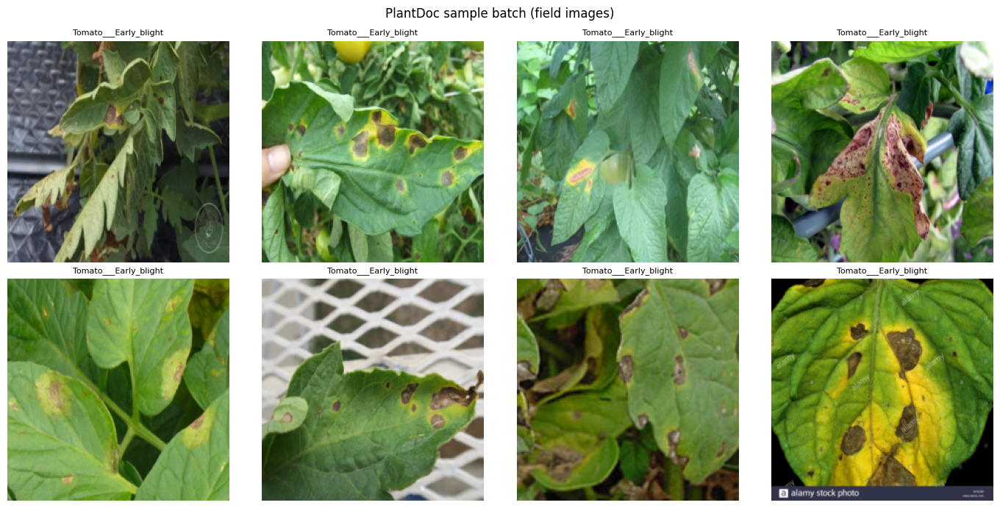

In [49]:
# ===== Block 23: Preprocess step 4 — visualize a sample batch =====

images, labels = next(iter(plantdoc_loader))
fig, axes = plt.subplots(2, 4, figsize=(14, 7))
for i, ax in enumerate(axes.flat):
    img = denormalize(images[i], IMAGENET_MEAN, IMAGENET_STD).permute(1, 2, 0).numpy()
    img = np.clip(img, 0, 1)
    ax.imshow(img)
    ax.set_title(idx_to_label[labels[i].item()], fontsize=8)
    ax.axis("off")
plt.suptitle("PlantDoc sample batch (field images)")
plt.tight_layout()
plt.show()

In [52]:
# ===== Block 24: Evaluate both trained models on preprocessed PlantDoc =====

plantdoc_eval_results = {}

for model_name in model_names:
    model = eval_results[model_name]["model"]  # reuse already-loaded best checkpoint
    model.eval()

    all_preds, all_labels = [], []
    with torch.no_grad():
        for images, labels in plantdoc_loader:
            images = images.to(device)
            outputs = model(images)
            preds = torch.argmax(outputs, dim=1).cpu().numpy()
            all_preds.extend(preds)
            all_labels.extend(labels.numpy())

    present_labels = sorted(set(all_labels))
    present_label_names = [idx_to_label[i] for i in present_labels]

    report = classification_report(all_labels, all_preds, labels=present_labels,
                                    target_names=present_label_names, output_dict=True, zero_division=0)

    # full-size CM (num_classes x num_classes) so it aligns with the val CM for side-by-side comparison
    cm_full = confusion_matrix(all_labels, all_preds, labels=list(range(num_classes)))

    plantdoc_eval_results[model_name] = {
        "report": report,
        "cm": cm_full,
        "all_preds": all_preds,
        "all_labels": all_labels
    }

    print(f"\n===== {model_name} on PlantDoc =====")
    print(classification_report(all_labels, all_preds, labels=present_labels,
                                 target_names=present_label_names, zero_division=0))


===== efficientnet_b0 on PlantDoc =====
                                        precision    recall  f1-score   support

               Tomato___Bacterial_spot       1.00      0.01      0.02       110
                 Tomato___Early_blight       0.16      0.73      0.26        88
                  Tomato___Late_blight       0.19      0.57      0.29       111
                    Tomato___Leaf_Mold       0.20      0.01      0.02        91
           Tomato___Septoria_leaf_spot       0.52      0.24      0.33       157
Tomato___Tomato_Yellow_Leaf_Curl_Virus       0.88      0.26      0.41       238
          Tomato___Tomato_mosaic_virus       0.00      0.00      0.00        54
                      Tomato___healthy       0.82      0.17      0.29        52

                              accuracy                           0.27       901
                             macro avg       0.47      0.25      0.20       901
                          weighted avg       0.55      0.27      0.25       9

In [51]:
# ===== Block 25: PlantVillage vs PlantDoc accuracy comparison =====

comparison_rows = []
for model_name in model_names:
    pv_acc = eval_results[model_name]["report"]["accuracy"]
    pd_acc = plantdoc_eval_results[model_name]["accuracy"]
    comparison_rows.append({
        "model": model_name,
        "plantvillage_val_acc": pv_acc,
        "plantdoc_acc": pd_acc,
        "accuracy_drop": pv_acc - pd_acc
    })

comparison_df = pd.DataFrame(comparison_rows)
print(comparison_df)
comparison_df.to_csv("/kaggle/working/plantvillage_vs_plantdoc_comparison.csv", index=False)

             model  plantvillage_val_acc  plantdoc_acc  accuracy_drop
0  efficientnet_b0              0.999449      0.265261       0.734189
1         resnet50              0.999449      0.211987       0.787463


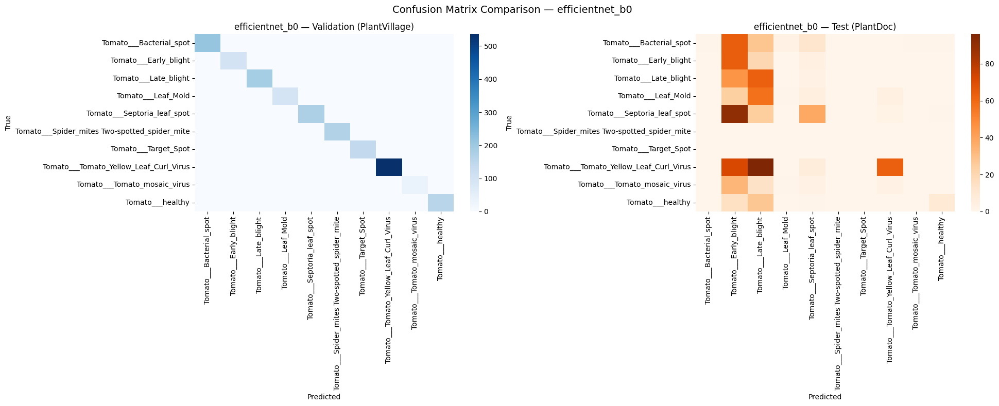

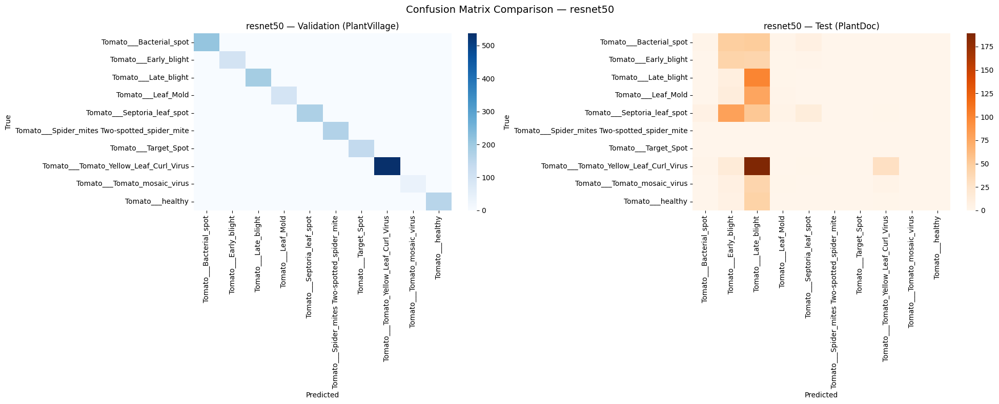

In [53]:
# ===== Block 26: Confusion matrix comparison — Val (PlantVillage) vs Test (PlantDoc) =====

for model_name in model_names:
    cm_val = eval_results[model_name]["cm"]
    cm_test = plantdoc_eval_results[model_name]["cm"]

    fig, axes = plt.subplots(1, 2, figsize=(20, 8))

    sns.heatmap(cm_val, annot=False, cmap="Blues", xticklabels=label_names_sorted, yticklabels=label_names_sorted, ax=axes[0])
    axes[0].set_title(f"{model_name} — Validation (PlantVillage)")
    axes[0].set_xlabel("Predicted")
    axes[0].set_ylabel("True")
    axes[0].tick_params(axis='x', rotation=90)

    sns.heatmap(cm_test, annot=False, cmap="Oranges", xticklabels=label_names_sorted, yticklabels=label_names_sorted, ax=axes[1])
    axes[1].set_title(f"{model_name} — Test (PlantDoc)")
    axes[1].set_xlabel("Predicted")
    axes[1].set_ylabel("True")
    axes[1].tick_params(axis='x', rotation=90)

    plt.suptitle(f"Confusion Matrix Comparison — {model_name}", fontsize=14)
    plt.tight_layout()
    plt.savefig(f"/kaggle/working/cm_comparison_{model_name}.png", dpi=150, bbox_inches="tight")
    plt.show()